<a href="https://colab.research.google.com/github/BDavidReyesU/Talento-tech/blob/main/Neuronal_Training_cat__dog_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds

setattr(tfds.image_classification.cats_vs_dogs, '_URL',"https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip")
#Descargar base de datos de tensorflow

datos, metadatos = tfds.load('cats_vs_dogs', as_supervised=True, with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cats_vs_dogs/4.0.1.incompletePG7VC3/cats_vs_dogs-train.tfrecord*...:   0%|…

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.1. Subsequent calls will reuse this data.


<ipython-input-15-1d00d4d90d97>:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(5,5, i+1)


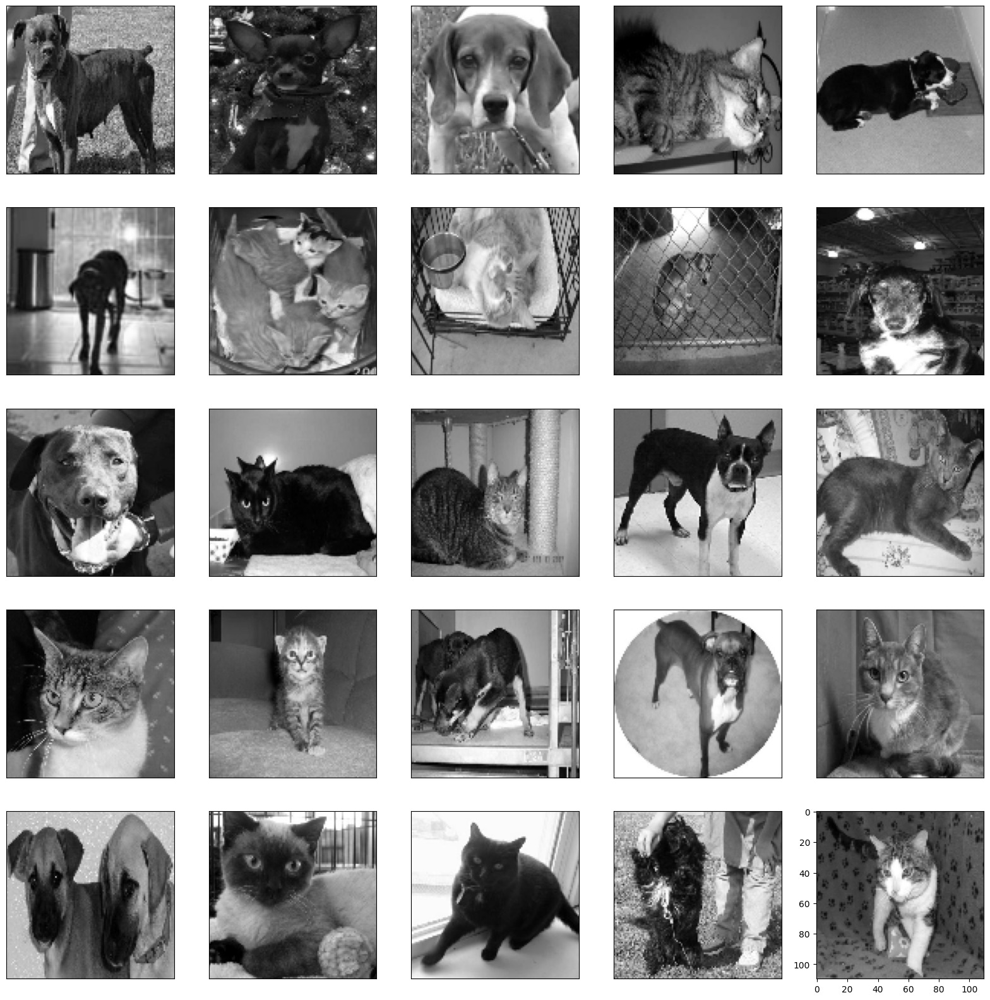

In [ ]:
import matplotlib.pyplot as plt
import cv2
TAMANO_IMG = 110
plt.figure(figsize= (20,20))
for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  imagen = cv2.resize(imagen.numpy(),(TAMANO_IMG,TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  plt.xticks([])
  plt.yticks([])
  plt.subplot(5,5, i+1)
  plt.imshow(imagen,cmap='gray')

In [ ]:
datos_entrenamiento = []

In [ ]:
for i,(imagen,etiqueta) in enumerate(datos['train']): #Todos los datos
 imagen = cv2.resize(imagen.numpy(),(TAMANO_IMG,TAMANO_IMG))
 imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
 imagen =imagen.reshape(TAMANO_IMG,TAMANO_IMG,1) #110*110*1
 datos_entrenamiento.append([imagen,etiqueta])

In [ ]:
datos_entrenamiento[0]

[array([[[251],
         [201],
         [122],
         ...,
         [181],
         [184],
         [136]],
 
        [[240],
         [146],
         [ 89],
         ...,
         [180],
         [151],
         [182]],
 
        [[194],
         [ 93],
         [ 81],
         ...,
         [156],
         [142],
         [176]],
 
        ...,
 
        [[120],
         [166],
         [163],
         ...,
         [145],
         [158],
         [ 94]],
 
        [[133],
         [140],
         [103],
         ...,
         [ 89],
         [195],
         [146]],
 
        [[ 81],
         [125],
         [139],
         ...,
         [ 59],
         [ 55],
         [ 39]]], dtype=uint8),
 <tf.Tensor: shape=(), dtype=int64, numpy=1>]

In [ ]:
len(datos_entrenamiento)

23262

In [ ]:
x = [] #Input de entrada
y = [] #cats o dogs
for imagen, etiqueta in datos_entrenamiento:
  x.append(imagen)
  y.append(etiqueta)

In [ ]:
x

In [ ]:
import numpy as np
x = np.array(x).astype(float) / 225

In [ ]:
y

array([1, 1, 1, ..., 0, 1, 0])

In [ ]:
y = np.array(y)

In [ ]:
modeloDenso = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(110,110,1)),
    tf.keras.layers.Dense(150, activation='relu'),
    tf.keras.layers.Dense(150, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  #Esta funcion va en 0 y 1
])

modeloCNN =tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32,(3,3),activation='relu',input_shape=(110,110,1)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64,(3,3),activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128,(3,3),activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),


    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(110, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN2 =tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32,(3,3),activation='relu',input_shape=(110,110,1)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64,(3,3),activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128,(3,3),activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(250, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
modeloDenso.compile(optimizer='adam',
                   loss='binary_crossentropy',
                   metrics=['accuracy'])

modeloCNN.compile(optimizer='adam',
                   loss='binary_crossentropy',
                   metrics=['accuracy'])

modeloCNN2.compile(optimizer='adam',
                   loss='binary_crossentropy',
                   metrics=['accuracy'])


In [ ]:
from tensorflow.keras.callbacks import TensorBoard

In [ ]:
TensorboardDenso = TensorBoard(log_dir='logs/denso')
modeloDenso.fit(x,y,batch_size=32,
               validation_split=0.15,
               epochs=100,
               callbacks=[TensorboardDenso])

Epoch 1/100
618/618 [==============================] - 6s 5ms/step - loss: 0.7223 - accuracy: 0.5450 - val_loss: 0.7004 - val_accuracy: 0.5146
Epoch 2/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6865 - accuracy: 0.5410 - val_loss: 0.6833 - val_accuracy: 0.5602
Epoch 3/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6826 - accuracy: 0.5536 - val_loss: 0.6757 - val_accuracy: 0.5745
Epoch 4/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6820 - accuracy: 0.5590 - val_loss: 0.6756 - val_accuracy: 0.5768
Epoch 5/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6799 - accuracy: 0.5647 - val_loss: 0.6761 - val_accuracy: 0.5734
Epoch 6/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6789 - accuracy: 0.5670 - val_loss: 0.6808 - val_accuracy: 0.5734
Epoch 7/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6779 - accuracy: 0.5705 - val_loss: 0.6803 - val_accuracy: 0.5636

In [ ]:
pip install tensorboard

In [ ]:
import tensorboard
%load_ext tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
tensorboardCNN2 = TensorBoard(log_dir='logs/cnn2')
modeloCNN2.fit(x, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardCNN2])

Epoch 1/100
618/618 [==============================] - 18s 22ms/step - loss: 0.6259 - accuracy: 0.6433 - val_loss: 0.5438 - val_accuracy: 0.7198
Epoch 2/100
618/618 [==============================] - 10s 17ms/step - loss: 0.4826 - accuracy: 0.7675 - val_loss: 0.4598 - val_accuracy: 0.7840
Epoch 3/100
618/618 [==============================] - 11s 17ms/step - loss: 0.4249 - accuracy: 0.8020 - val_loss: 0.4285 - val_accuracy: 0.8009
Epoch 4/100
618/618 [==============================] - 10s 17ms/step - loss: 0.3817 - accuracy: 0.8279 - val_loss: 0.3978 - val_accuracy: 0.8272
Epoch 5/100
618/618 [==============================] - 11s 17ms/step - loss: 0.3360 - accuracy: 0.8540 - val_loss: 0.3614 - val_accuracy: 0.8407
Epoch 6/100
618/618 [==============================] - 11s 17ms/step - loss: 0.2988 - accuracy: 0.8723 - val_loss: 0.3924 - val_accuracy: 0.8235
Epoch 7/100
618/618 [==============================] - 11s 17ms/step - loss: 0.2636 - accuracy: 0.8867 - val_loss: 0.3800 - val_ac

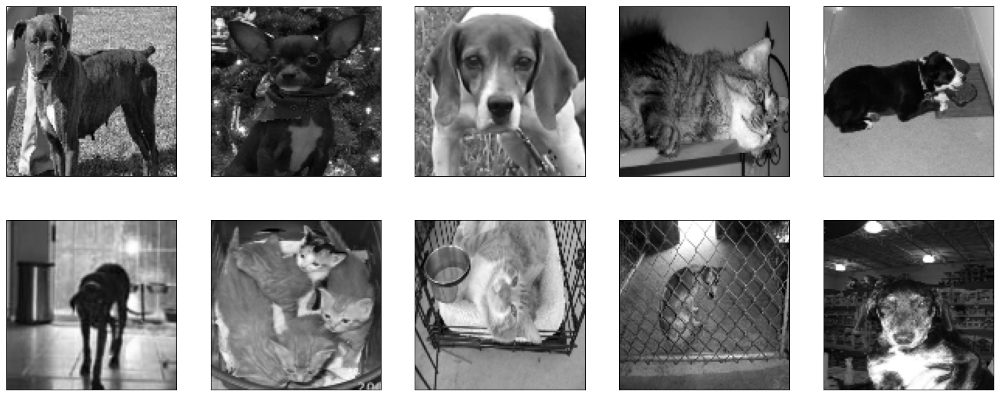

In [ ]:
#ver las imagenes de la variable X sin modificaciones por aumento de datos

plt.figure(figsize=(20, 8))
for i in range(10):
  plt.subplot(2, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(x[i].reshape(110, 110), cmap="gray")

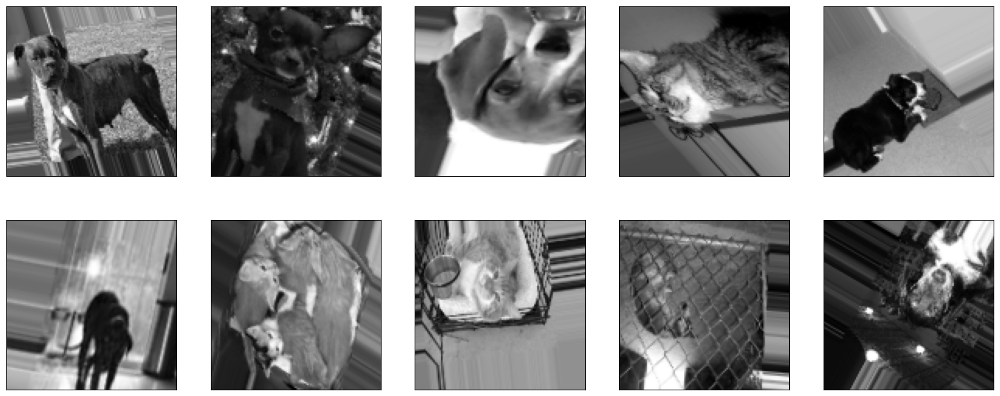

In [ ]:
#Realizar el aumento de datos con varias transformaciones. Al final, graficar 10 como ejemplo
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=15,
    zoom_range=[0.7, 1.4],
    horizontal_flip=True,
    vertical_flip=True
)

datagen.fit(x)

plt.figure(figsize=(20,8))

for imagen, etiqueta in datagen.flow(x, y, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen[i].reshape(x.shape[1], x.shape[2]), cmap="gray")
  break


In [ ]:
modeloDenso_AD = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(100, 100, 1)),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN_AD = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN2_AD = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Dropout(0.5),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(250, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
modeloDenso_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN2_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [ ]:
#Separar los datos de entrenamiento y los datos de pruebas en variables diferentes

len(x) * .85 #19700
len(x) - 12100 #3562

x_entrenamiento = x[:19700]
x_validacion = x[12100:]

y_entrenamiento = y[:12100]
y_validacion = y[12100:]

In [ ]:
#Usar la funcion flow del generador para crear un iterador que podamos enviar como entrenamiento a la funcion FIT del modelo
data_gen_entrenamiento = datagen.flow(x_entrenamiento, y_entrenamiento, batch_size=32)

In [ ]:
tensorboardCNN_AD = TensorBoard(log_dir='logs-new/cnn_AD')



modeloDenso_AD.fit(
    data_gen_entrenamiento,
    epochs=100,
    batch_size=32,
    validation_data=(x_validacion, y_validacion),
    steps_per_epoch=len(x_entrenamiento) // 32,
    validation_steps=len(x_validacion) // 32,
    callbacks=[tensorboardCNN_AD] #tensorboardDenso_AD
)

NameError: name 'TensorBoard' is not defined